# Self-Driving Car Engineer Nanodegree

## Project: Build a Traffic Sign Recognition Classifier

---
## Overview
The goal of this project is to build a convolution neural network in Keras that clones a driver's behavior and predicts steering angles from images. The model I built could successfully drive around track one without leaving the road. The following animation shows how the car drives on the lake side track.

[Animation Place holder]()

My project includes the following files:

`model.py` containing the script to create and train the model  
`utils.py` containing all the utilities functions  
`drive.py` for driving the car in autonomous mode  
`model.h5` containing a trained convolution neural network  
`README.md` summarizing the results  


In [1]:
"""
Finding the correction matrix and distortion coefficients
"""

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = np.mgrid[0:8, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
image_names = glob.glob('camera_cal/calibration*.jpg')
image_names.sort()

# Step through the list and search for chessboard corners
for idx, fname in enumerate(image_names):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_size = (img.shape[1], img.shape[0])
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (8,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(img, (8,6), corners, ret)

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

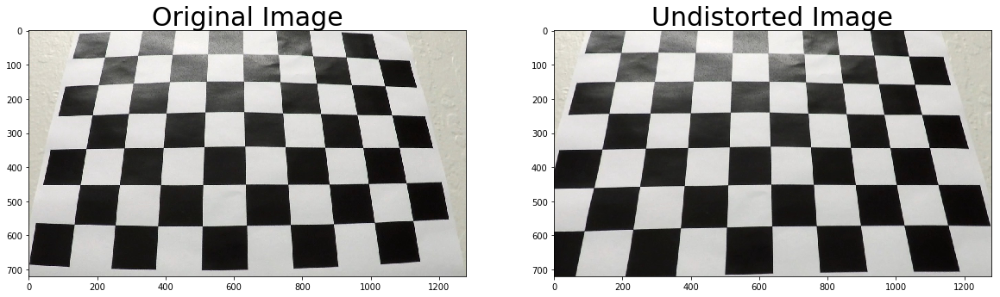

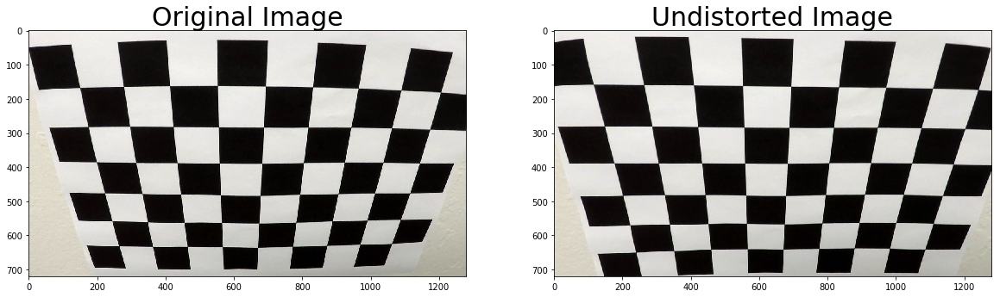

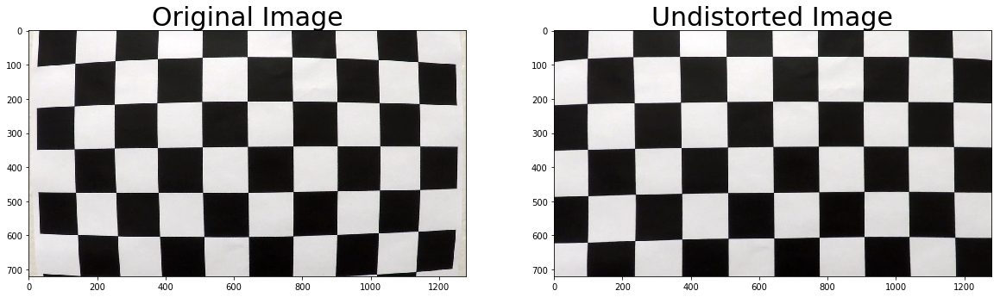

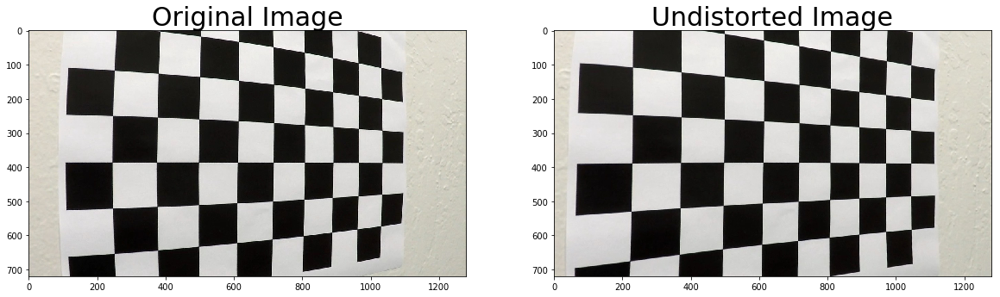

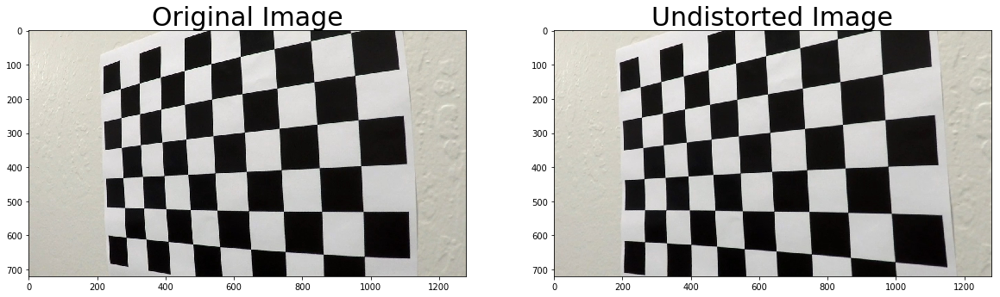

In [2]:
"""
Undistort the images
"""

import pickle
import os
%matplotlib inline

def undistort(mtx, dist, img_in_path, img_out_path='', plot=False):
    # Test undistortion on an image
    img = cv2.imread(img_in_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_size = (img.shape[1], img.shape[0])
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    if img_out_path:
        cv2.imwrite(img_out_path,dst)
    
    if plot:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(dst)
        ax2.set_title('Undistorted Image', fontsize=30)
    return dst

image_in_folder = 'camera_cal/'
image_out_folder = 'camera_cal_output/'
files = [x for x in os.listdir(image_in_folder) if x.endswith('.jpg')]
chessboard_undists = []
for file in files:
    chessboard_undists.append(undistort(mtx,dist,
                              os.path.join(image_in_folder,file),
                              os.path.join(image_out_folder,file),
                              plot=True))

In [12]:
# X,Y
img_size = (1280, 720)

# MMa 2017-06-27 Why it failed immediately when top source points are less then half of the height ??!
src = np.float32([ [img_size[0]/2-116,img_size[1]/2+150],
                    [img_size[0]/2+116,img_size[1]/2+150],
                    [img_size[0]/2+320,img_size[1]],
                    [img_size[0]/2-320,img_size[1]]])

offset_x = 300 # offset for dst points
offset_y = 400
dst = np.float32([ [offset_x, offset_y], 
                    [img_size[0]-offset_x, offset_y], 
                    [img_size[0]-offset_x, img_size[1]], 
                    [offset_x, img_size[1]]])

M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)

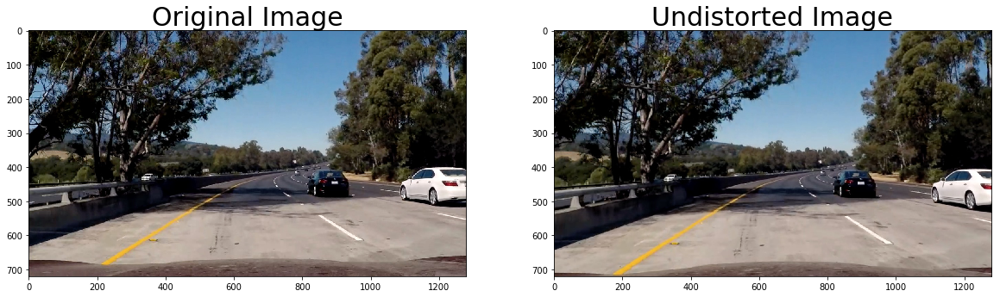

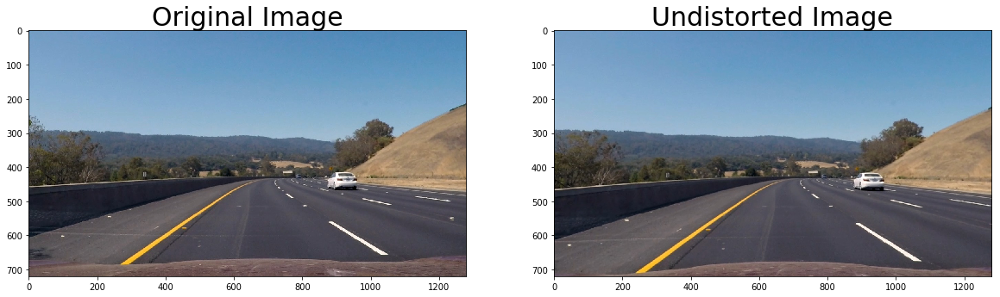

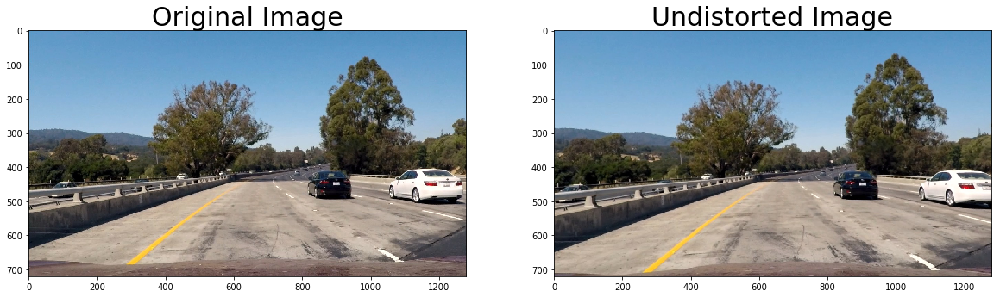

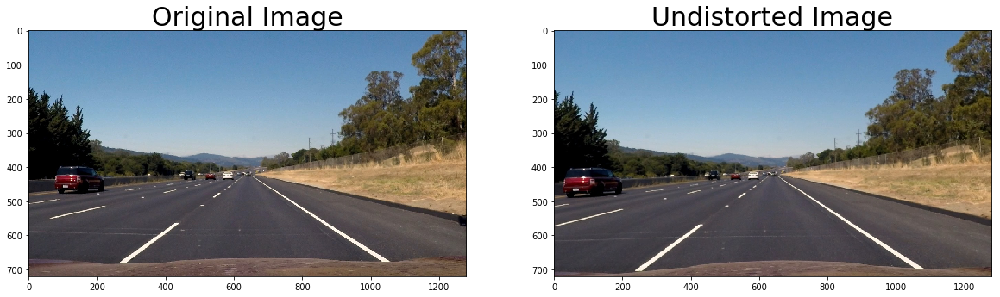

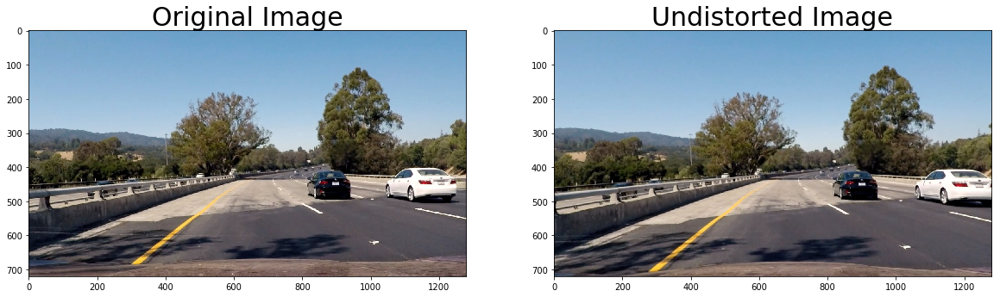

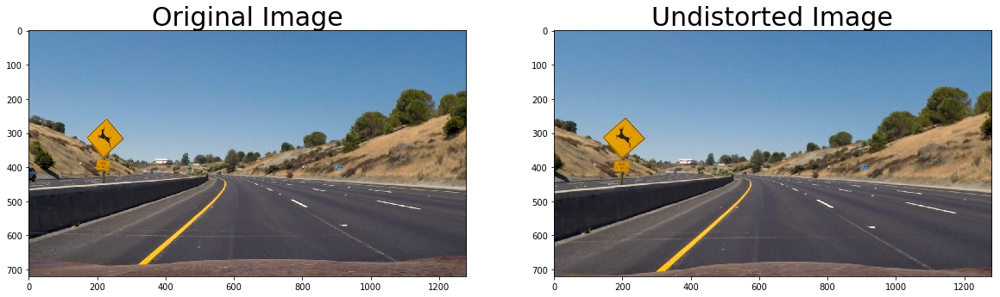

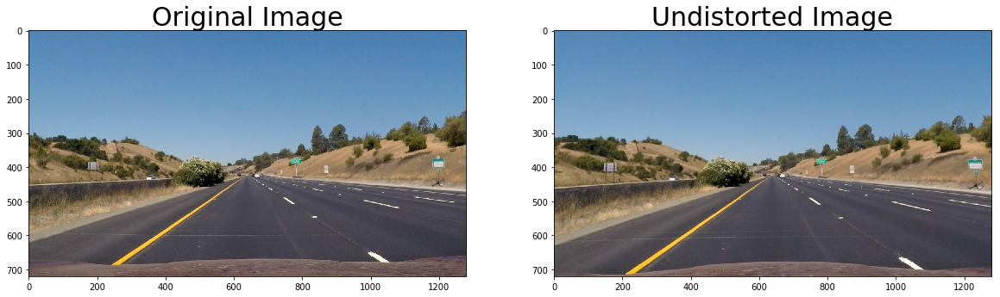

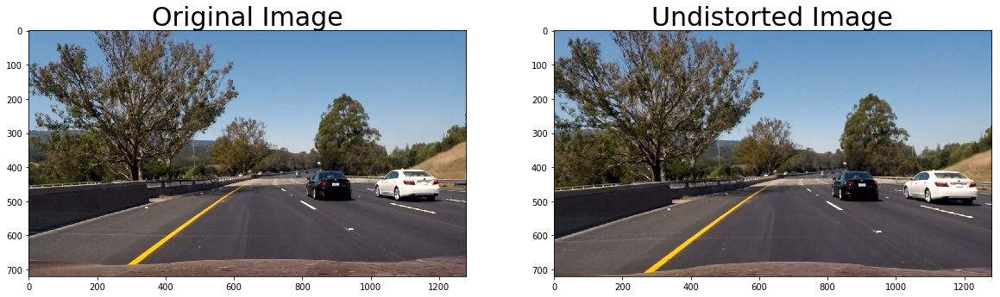

In [3]:
image_in_folder = 'test_images/'
files = [x for x in os.listdir(image_in_folder) if x.endswith('.jpg')]
images = []
for file in files:
    images.append(undistort(mtx,dist,
                            os.path.join(image_in_folder,file),
                            plot = True))

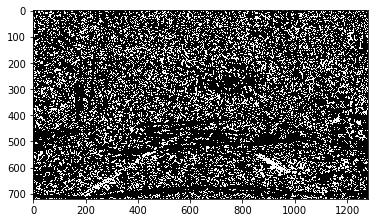

In [4]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
import utils

def test_dir(kernel_size, thresh_min, thresh_max):
    img_test = utils.gaussian_blur(images[0],9)

    dir_bin = utils.dir_thresh(img_test,kernel_size, 
                               thresh=(thresh_min, thresh_max))
    plt.imshow(dir_bin,cmap='gray')

    #dir_bin = utils.dir_thresh(img_test,15,thresh=(0.73, 1.16))
interact(test_dir,kernel_size=(1,31,2), 
         thresh_min=(0,np.pi/2,0.01), 
         thresh_max=(0,np.pi/2,0.01))

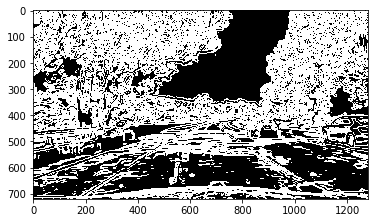

In [5]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
import utils

def test_mag(kernel_size, thresh_min, thresh_max):
    img_test = utils.gaussian_blur(images[0],9)

    mag_bin = utils.mag_thresh(img_test,kernel_size, 
                               thresh=(thresh_min, thresh_max))
    mag_bin = utils.mag_thresh(img_test,kernel_size, thresh=(8, 72))
    plt.imshow(mag_bin,cmap='gray')

interact(test_mag,kernel_size=(1,31,2), 
         thresh_min=(0,50), 
         thresh_max=(0,100))

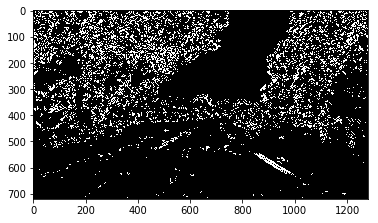

In [7]:
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
def test_mag_dir( mag_min_thresh, mag_max_thresh, 
                  dir_min_thresh, dir_max_thresh):
    img_test = utils.gaussian_blur(images[0],9)

    dir_bin = utils.dir_thresh(img_test, 15, thresh=(dir_min_thresh, dir_max_thresh))
    mag_bin = utils.mag_thresh(img_test, 15, thresh=(mag_min_thresh, mag_max_thresh))
    combined = np.zeros_like(dir_bin)
    combined[((dir_bin == 1) & (mag_bin == 1))] = 1
    plt.imshow(combined,cmap='gray')

interact(test_mag_dir,
         mag_min_thresh=(0,255), 
         mag_max_thresh=(0,255),
         dir_min_thresh=(0,np.pi/2,0.01), 
         dir_max_thresh=(0,np.pi/2,0.01))

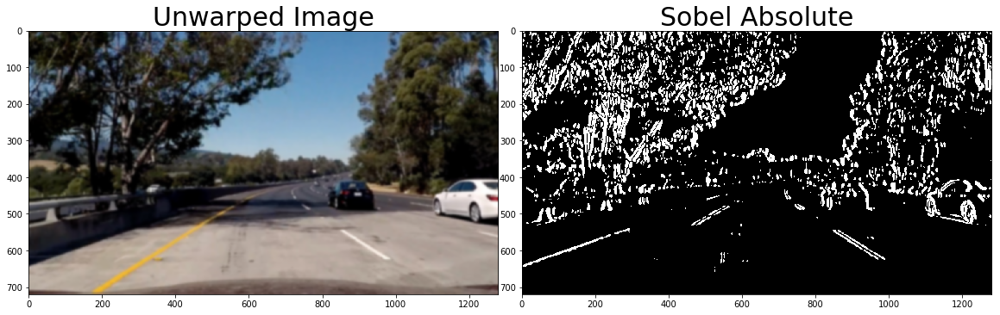

In [9]:
def test_abs_thresh(kernel_size, min_thresh, max_thresh):
    img_test = utils.gaussian_blur(images[0],kernel_size)
    test_out = utils.abs_sobel_thresh(img_test, 'x',
                                     thresh=(min_thresh, max_thresh))
    # Visualize sobel absolute threshold
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(img_test)
    ax1.set_title('Unwarped Image', fontsize=30)
    ax2.imshow(test_out, cmap='gray')
    ax2.set_title('Sobel Absolute', fontsize=30)
    
# kernel 9, min 18, max 255
interact(test_abs_thresh,
         kernel_size=(1,31,2),
         min_thresh=(0,100,1), 
         max_thresh=(0,255))

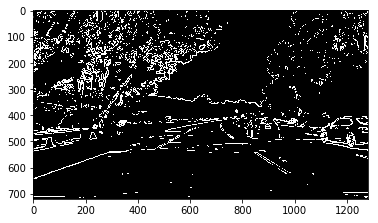

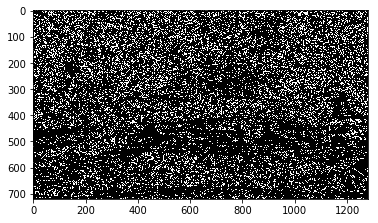

In [16]:
# for image in images:
image = images[0]
image_new = pipeline1(image)

# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(image)
# ax1.set_title('Original Image', fontsize=50)
# ax2.imshow(image_new,cmap='gray')
# ax2.set_title('Processed Image', fontsize=50)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)



In [56]:
def poly_fit(img):
    histogram = np.sum(img[int(img.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines

    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
#     print("left base {},right base {}".format(leftx_base,rightx_base))

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
#     print("Using window height {}".format(window_height))

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero  = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 3) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 3) 

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                           (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit,right_fit = None,None
    if lefty.any() and leftx.any():
        left_fit = np.polyfit(lefty, leftx, 2)
    if righty.any() and rightx.any():
        right_fit = np.polyfit(righty, rightx, 2)
#     print(left_fit)
#     print(right_fit)
    return left_fit, right_fit

def curvature(ploty,leftx,rightx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
#     print(left_curverad, 'm', right_curverad, 'm')
#     print(left_fit_cr[0]*y_eval*ym_per_pix, 'm', right_fit_cr[0]*y_eval*ym_per_pix, 'm')
    return left_curverad,right_curverad

def draw_lane(img,ploty,left_fitx,right_fitx):
    img_new = img.copy()
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(img).astype(np.uint8)
    color_warp = warp_zero #np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (img.shape[1], img.shape[0])) 
    
    # Combine the result with the original image
    img_new = cv2.addWeighted(img_new, 1, newwarp, 0.3, 0)
    return img_new

def draw_info(img, curv, center_dist):
    img_new = np.copy(img)
    h = img_new.shape[0]
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = 'Curvature : {:4.2f}'.format(curv) + 'm'
    cv2.putText(img_new, text, (40,70), font, 1, (255,255,255), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:4.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(img_new, text, (40,120), font, 1, (255,255,255), 2, cv2.LINE_AA)
    return img_new

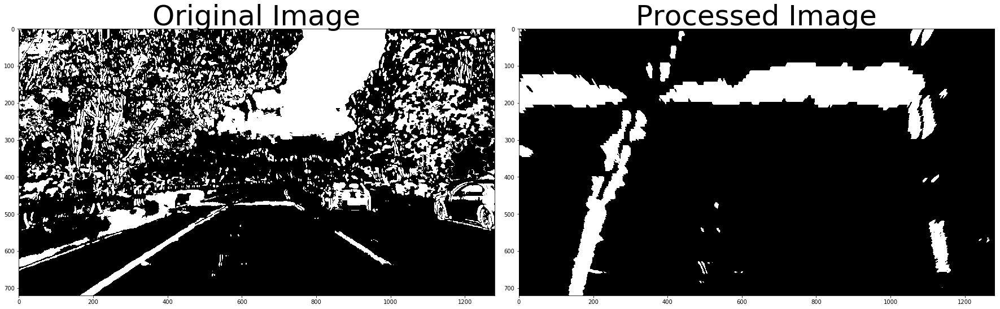

In [59]:
def select(img):
    filtered = utils.gaussian_blur(img,9)
    s = utils.hls_select(filtered,thresh=(100, 255))
    
    grad_x= utils.abs_sobel_thresh(filtered, 'x',thresh=(32, 255))
    grad_y= utils.abs_sobel_thresh(filtered, 'y',thresh=(32, 255))
    
    dir_bin = utils.dir_thresh(filtered,15, thresh=(0.63, 1.))
    mag_bin = utils.mag_thresh(filtered,15, thresh=(70, 78))

    combined = np.zeros_like(mag_bin)
    combined[((grad_x == 1) ) | 
             ((mag_bin == 1) & (dir_bin == 1)) |
             s > 0] = 1
    
    return combined

def pipeline(img):
    undistort = cv2.undistort(img, mtx, dist, None, mtx)
    img_bin = select(undistort)
    warped = cv2.warpPerspective(img_bin, M, img_size, flags=cv2.INTER_LINEAR)
    left_fit,right_fit = poly_fit(warped)
    if left_fit == None or right_fit == None:
        return img
    # Generate x and y values for plotting
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    curv_left, curv_right = curvature(ploty,left_fitx,right_fitx)
    result = draw_lane(undistort,ploty,left_fitx,right_fitx)
    result = draw_info(result,(curv_left+curv_right)/2,0)
    return result

img_bin = select(images[0])
warped = cv2.warpPerspective(img_bin, M, img_size, flags=cv2.INTER_LINEAR)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img_bin,cmap='gray')
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(warped,cmap='gray')
ax2.set_title('Processed Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

plt.show()

/home/mma/miniconda3/envs/carnd-term1-cpu/lib/python3.5/site-packages/ipykernel_launcher.py:24: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.


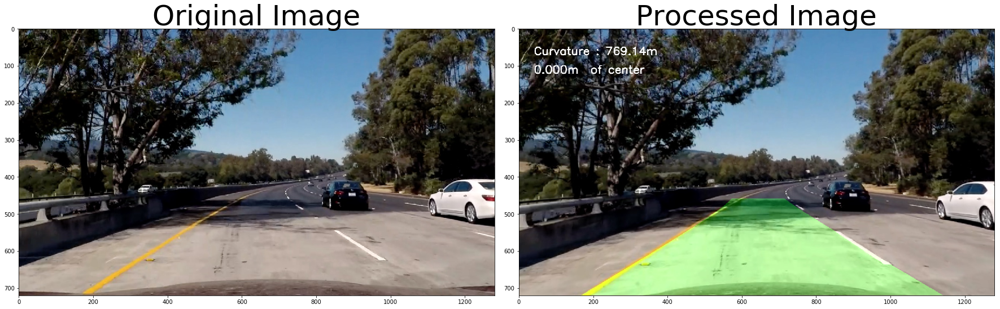

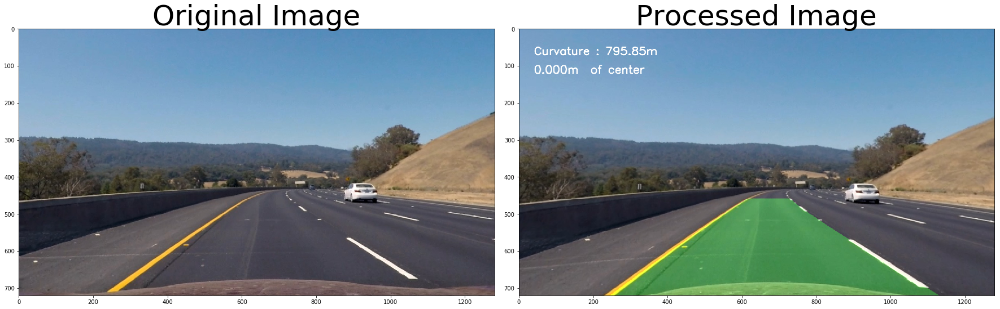

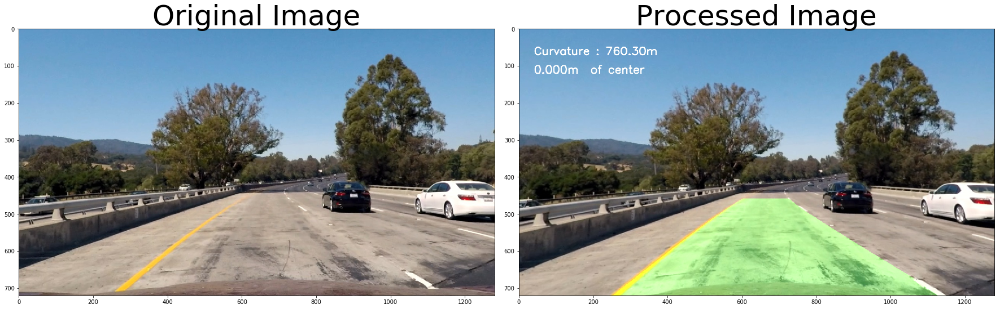

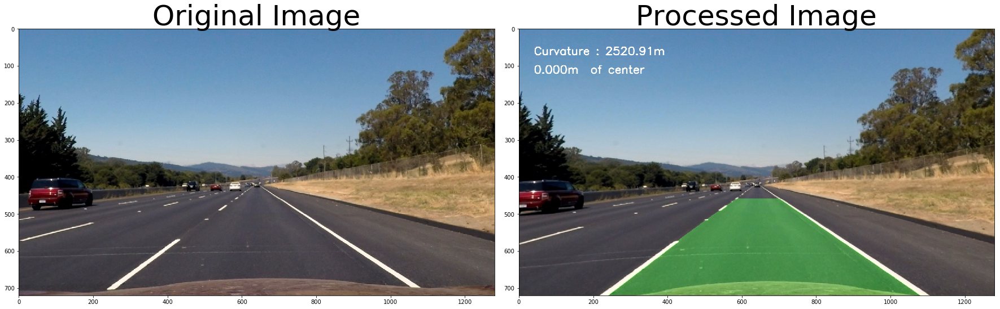

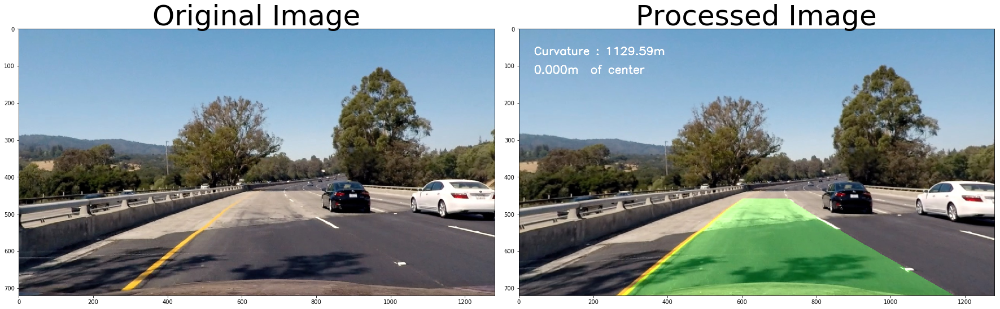

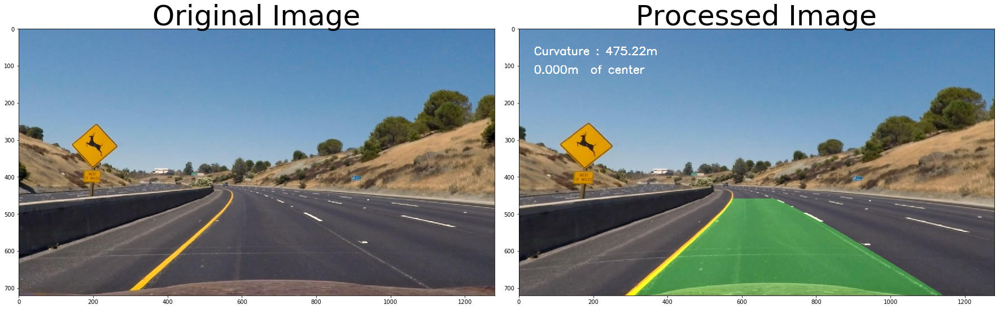

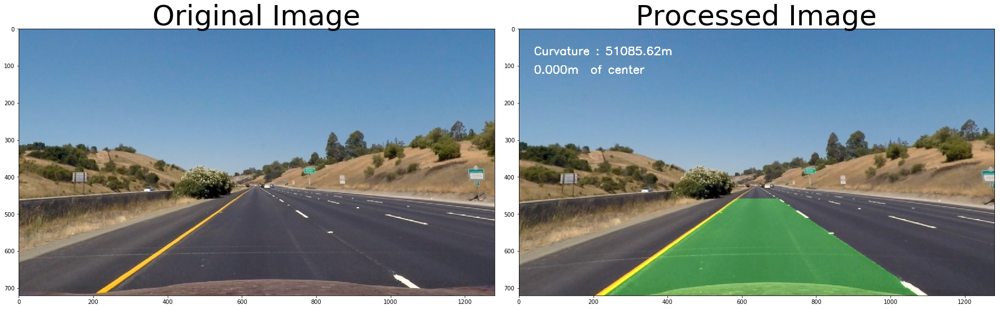

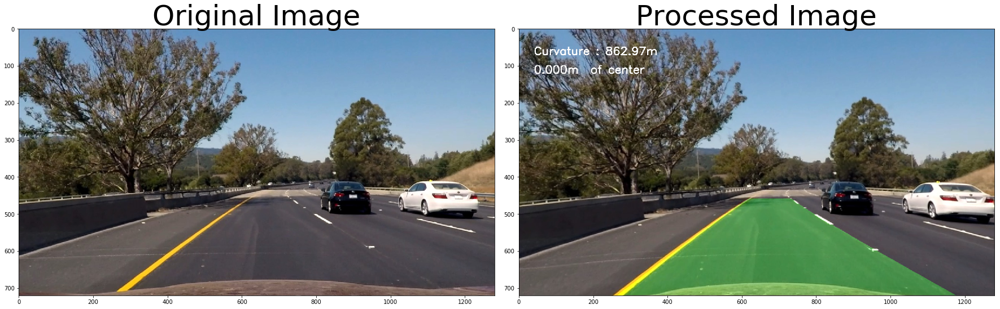

In [60]:
for image in images:
    image_new = pipeline(image)

    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(image_new)
    ax2.set_title('Processed Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    plt.show()

In [61]:
from moviepy.editor import VideoFileClip

video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(pipeline)
processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [07:43<00:00,  2.87it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

